* **Goal of the day:** Show how to do a spring network dynamics
* **Coder:** Paul Valcke

In [11]:
import sys
sys.path.insert(0,  "../../" )
import chimes as chm
import numpy as np 
import matplotlib.pyplot as plt

import plotly.graph_objects as go
import numpy as np


In [29]:
import plotly.graph_objects as go
import numpy as np

def plot_spring_network(hub,Node1,Node2,L0,returnFig=False):

    Nspring=len(Node1)

    R=hub.get_dfields()
    nt = R['nt']['value']
    x = R[  'x']['value'][:,0,0,:,0]
    y = R[  'y']['value'][:,0,0,:,0]
    fx = R['Fx']['value'][:,0,0,:,0]
    fy = R['Fy']['value'][:,0,0,:,0]
    FMX = R['Fmx']['value'][:,0,0,:,:]
    FMY = R['Fmy']['value'][:,0,0,:,:]
    m = R['m']['value'][0,0,:,0]

    Springreldist = np.zeros((nt,Nspring))
    for k in range(Nspring):
        Springreldist[:,k]= ((x[:,Node1[k]]-x[:,Node2[k]])**2 + 
                            (y[:,Node1[k]]-y[:,Node2[k]])**2)**(1/2) 
        Springreldist[:,k] /= L0[k]


    # Function to create quiver plot
    def create_quiver(x, y, u, v, scale=0.2, color='black'):
        quivers = []
        for xi, yi, ui, vi in zip(x, y, u, v):
            quivers.append(go.Scatter(
                x=[xi, xi + ui*scale],
                y=[yi, yi + vi*scale],
                mode='lines',
                line=dict(color=color),
                showlegend=False
            ))
            # Add larger arrow head
            quivers.append(go.Scatter(
                x=[xi + ui*scale],
                y=[yi + vi*scale],
                mode='markers',
                marker=dict(size=10, color=color, symbol='star-triangle-up'),
                showlegend=False
            ))
        return quivers

    # Function to get color based on Springreldist value
    def get_color(value):
        value = 0.5*(1+np.tanh(100*(value-1)))
        #value = max(0, min(value, 3))  # Clamp the value between 0 and 3
        red = int(255 * value)
        blue = 255 - red
        return f'rgb({red}, 0, {blue})'
    def scatt(x,y,t,m):
        return go.Scatter(
        x=x[t],
        y=y[t],
        mode='markers',
        marker=dict(size=10*m**(1/3), color='black'),
        name='Nodes'
    )
    def springline(x,y,Node1,Node2,Springreldist,t):
        color = get_color(Springreldist[0, i])
        return go.Scatter(
                x=[x[t, Node1[i]], x[t, Node2[i]]],
                y=[y[t, Node1[i]], y[t, Node2[i]]],
                mode='lines',
                line=dict(width=2, color=color),
                showlegend=False
            )
    # Create initial scatter plot and quiver plot
    fig = go.Figure()


    fig.add_trace(scatt(x,y,0,m=10))                    # Add scatter plot for nodes
    quivers = create_quiver(x[0], y[0], fx[0], fy[0])   # Add quiver plot for forces
    for q in quivers: fig.add_trace(q)
    for i in range(Nspring): fig.add_trace(springline(x,y,Node1,Node2,Springreldist,0))

    # Create frames for animation
    frames = []
    for t in range(nt):
        frame_data = [scatt(x,y,t,m)]
        quivers = create_quiver(x[t], y[t], fx[t], fy[t])
        frame_data.extend(quivers)
        for i in range(Nspring): frame_data.append(springline(x,y,Node1,Node2,Springreldist,t))
        frames.append(go.Frame(data=frame_data, name=str(t)))


    # Update layout with fixed axis limits
    fig.update_layout(
        xaxis=dict(range=[np.min(x)-1, np.max(x)+1], scaleanchor="y", scaleratio=1),
        yaxis=dict(range=[np.min(y)-1, np.max(y)+1]),
        updatemenus=[{
            'buttons': [
                {
                    'args': [None, {'frame': {'duration': 50, 'redraw': True}, 'fromcurrent': True}],
                    'label': 'Play',
                    'method': 'animate'
                },
                {
                    'args': [[None], {'frame': {'duration': 0, 'redraw': True}, 'mode': 'immediate', 'transition': {'duration': 0}}],
                    'label': 'Pause',
                    'method': 'animate'
                }
            ],
            'direction': 'left',
            'pad': {'r': 10, 't': 87},
            'showactive': False,
            'type': 'buttons',
            'x': 0.1,
            'xanchor': 'right',
            'y': 0,
            'yanchor': 'top'
        }],
        sliders=[{
            'steps': [{'args': [[f.name], {'frame': {'duration': 50, 'redraw': True}, 'mode': 'immediate', 'transition': {'duration': 0}}],
                    'label': str(k),
                    'method': 'animate'} for k, f in enumerate(frames)],
            'active': 0,
            'transition': {'duration': 0},
            'x': 0.1,
            'xanchor': 'left',
            'y': 0,
            'yanchor': 'top'
        }]
    )

    fig.frames = frames

    if returnFig:
        return fig 
    else:
        fig.show()


In [13]:
hub=chm.Hub('Spring_Network')

# Nodes generation
Nnodes=10
x = np.random.normal(size=Nnodes)
y = np.random.normal(size=Nnodes)
m = np.random.lognormal(size=Nnodes)

# Springs generation
Nspring = 10
Node1 = np.random.randint(0,Nnodes,size=Nspring)
Node2 = np.random.randint(0,Nnodes,size=Nspring)
#Node1=[0,2,0]
#Node2=[1,1,2]
k = np.random.lognormal(size=Nspring)
L0 = np.random.lognormal(size=Nspring)
K,L = hub.supplements['Springlist_to_K_L0'](Node1,Node2,k,L0,Nnodes)

# Integration 
hub.set_fields(Nnodes=Nnodes,
               x=x,
               y=y,
               m=m,
               damp=1,
               Kmat=K,
               L0Mat=L,
               Tsim=30,
               dt=0.1)
hub.run() 


time step 300 / 300


# Presets
1. masse infini, masse ressort 1 mouvement horizontal
2. masse infini, masse ressort 1 mouvement circulaire
3. N masses, extremites infinies, compression inhomogene
4. maillage 2D regulier 

# Preset 

In [14]:
### PRESET 1 
"""
One fixed node (mass=100), one compressed spring with a mass at the other side.
Expected behavior: horizontal oscillations of the second point.
"""
hub=chm.Hub('Spring_Network')

dic = dict(
# Preset 1 
Nnodes = 2 ,
x = [0,1],
y = [0,0],
vx = [0,0],
vy = [0,0],
m = [100,1],
Nspring = 1 ,
damp = 0,
Node1 = [0],
Node2 = [1],
k = [1],
L0 = [0.8],
)
dic['K'],dic['L'] = hub.supplements['Springlist_to_K_L0'](**dic)

hub.set_fields(Tsim=30,
               dt=0.1,
               **dic)
hub.run() 
plot_spring_network(hub,dic['Node1'],dic['Node2'],dic['L0'],)

time step 300 / 300


time step 300 / 300


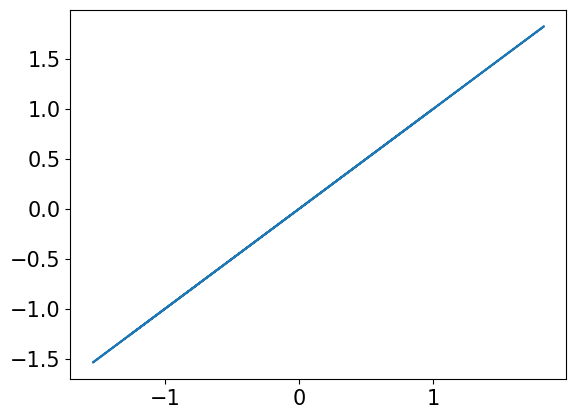

In [20]:
"""
One fixed node (mass=100), one other with initial speend horizontal to the spring
Expected behavior: oscillations of the second point.
"""
hub=chm.Hub('Spring_Network')

# Preset 2 
Nnodes = 2 
x = [0,1]
y = [0,0]
vx= [0,0]
vy = [0,1]
m = [100,1]
Nspring = 1 
damp = 0
Node1 = [0]
Node2 = [1]
k = [1]
L0 = [1]
K,L = hub.supplements['Springlist_to_K_L0'](Node1,Node2,k,L0,Nnodes)

hub.set_fields(Nnodes=Nnodes,
               x=x,
               y=y,
               vx=vx,
               vy=vy,
               m=m,
               damp=0,
               Kmat=K,
               L0Mat=L,
               Tsim=30,
               dt=0.1)
hub.run() 

R= hub.get_dfields()
x=R['x']['value'][:,0,0,1,0]
y=R['y']['value'][:,0,0,1,0]

plt.figure()
plt.plot(x,y)
plt.show()

plot_spring_network(hub,dic['Node1'],dic['Node2'],dic['L0'],)


In [32]:
hub=chm.Hub('Spring_Network')


### CIRCULAR CHAIN
Nnodes = 10
x = np.cos(2*np.pi*np.linspace(0,1,Nnodes))*Nnodes/(2*np.pi) 
y = np.sin(2*np.pi*np.linspace(0,1,Nnodes))*Nnodes/(2*np.pi) 
vx=  np.zeros(Nnodes)
vy =  np.zeros(Nnodes)
m = np.zeros(Nnodes)+1
#m[0] = 100
#m[-1] = 10
#vy[-1] = 1

Nspring = Nnodes
damp = 0
Node1 = np.arange(0,Nspring,1)
Node2 = np.arange(1,Nspring+1,1)
Node2[-1] = 0
k = np.zeros(Nspring)+1
L0 = np.zeros(Nspring)+1
#L0[-1] = 0.7
K,L = hub.supplements['Springlist_to_K_L0'](Node1,Node2,k,L0,Nnodes)

hub.set_fields(Nnodes=Nnodes,
               x=x,
               y=y,
               vx=vx,
               vy=vy,
               m=m,
               damp=0, 
               Kmat=K,
               L0Mat=L,
               Tsim=1000,
               dt=1)
hub.run() 

plot_spring_network(hub,dic['Node1'],dic['Node2'],dic['L0'],)


time step 1000 / 1000


In [24]:
print(Node1)
print(Node2)

[ 0  1  2  3  4  5  6  7  8  9 10]
[ 1  2  3  4  5  6  7  8  9 10  0]


In [44]:
hub=chm.Hub('Spring_Network')

Nnodes = 50 
x = np.arange(0,Nnodes,1)
y = np.zeros(Nnodes)
vx=  np.zeros(Nnodes)
vy =  np.zeros(Nnodes)
m = np.zeros(Nnodes)+1
m[0] = 100
m[-1] = 10
vy[-1] = 1

Nspring = Nnodes-1
damp = 0
Node1 = np.arange(0,Nspring,1)
Node2 = np.arange(1,Nspring+1,1)
k = np.zeros(Nspring)+1
L0 = np.zeros(Nspring)+1
#L0[-1] = 0.7
K,L = hub.supplements['Springlist_to_K_L0'](Node1,Node2,k,L0,Nnodes)

hub.set_fields(Nnodes=Nnodes,
               x=x,
               y=y,
               vx=vx,
               vy=vy,
               m=m,
               damp=0,
               Kmat=K,
               L0Mat=L,
               Tsim=1000,
               dt=1)
hub.run() 

plot_spring_network(hub,dic['Node1'],dic['Node2'],dic['L0'],)


time step 1000 / 1000


In [ ]:
hub=chm.Hub('Spring_Network')

# Preset 2 
Nnodes = 50 
x = np.arange(0,Nnodes,1)
y = np.zeros(Nnodes)
vx=  np.zeros(Nnodes)
vy =  np.zeros(Nnodes)
m = np.zeros(Nnodes)+1
m[0] = 100
m[-1] = 10
vy[-1] = 1

Nspring = Nnodes-1
damp = 0
Node1 = np.arange(0,Nspring,1)
Node2 = np.arange(1,Nspring+1,1)
k = np.zeros(Nspring)+1
L0 = np.zeros(Nspring)+1
#L0[-1] = 0.7
K,L = hub.supplements['Springlist_to_K_L0'](Node1,Node2,k,L0,Nnodes)

hub.set_fields(Nnodes=Nnodes,
               x=x,
               y=y,
               vx=vx,
               vy=vy,
               m=m,
               damp=0,
               Kmat=K,
               L0Mat=L,
               Tsim=1000,
               dt=1)
hub.run() 


In [ ]:
# Presets
# masse infini, masse ressort 1
# Preset 

In [ ]:
import plotly.graph_objects as go
import numpy as np

def plot_spring_network(hub,returnFig=False):

    # Function to create quiver plot
    def create_quiver(x, y, u, v, scale=0.2, color='black'):
        quivers = []
        for xi, yi, ui, vi in zip(x, y, u, v):
            quivers.append(go.Scatter(
                x=[xi, xi + ui*scale],
                y=[yi, yi + vi*scale],
                mode='lines',
                line=dict(color=color),
                showlegend=False
            ))
            # Add larger arrow head
            quivers.append(go.Scatter(
                x=[xi + ui*scale],
                y=[yi + vi*scale],
                mode='markers',
                marker=dict(size=10, color=color, symbol='star-triangle-up'),
                showlegend=False
            ))
        return quivers

    # Function to get color based on Springreldist value
    def get_color(value):
        value = 0.5*(1+np.tanh(100*(value-1)))
        #value = max(0, min(value, 3))  # Clamp the value between 0 and 3
        red = int(255 * value)
        blue = 255 - red
        return f'rgb({red}, 0, {blue})'
    def scatt(x,y,t,m):
        return go.Scatter(
        x=x[t],
        y=y[t],
        mode='markers',
        marker=dict(size=m, color='black'),
        name='Nodes'
    )
    def springline(x,y,Node1,Node2,Springreldist,t):
        color = get_color(Springreldist[0, i])
        return go.Scatter(
                x=[x[t, Node1[i]], x[t, Node2[i]]],
                y=[y[t, Node1[i]], y[t, Node2[i]]],
                mode='lines',
                line=dict(width=2, color=color),
                showlegend=False
            )
    # Create initial scatter plot and quiver plot
    fig = go.Figure()


    fig.add_trace(scatt(x,y,0,m=10))                    # Add scatter plot for nodes
    quivers = create_quiver(x[0], y[0], fx[0], fy[0])   # Add quiver plot for forces
    for q in quivers: fig.add_trace(q)
    for i in range(Nspring): fig.add_trace(springline(x,y,Node1,Node2,Springreldist,0))

    # Create frames for animation
    frames = []
    for t in range(nt):
        frame_data = [scatt(x,y,t,m)]
        quivers = create_quiver(x[t], y[t], fx[t], fy[t])
        frame_data.extend(quivers)
        for i in range(Nspring): frame_data.append(springline(x,y,Node1,Node2,Springreldist,0))
        frames.append(go.Frame(data=frame_data, name=str(t)))


    # Update layout with fixed axis limits
    fig.update_layout(
        xaxis=dict(range=[np.min(x)-1, np.max(x)+1]),
        yaxis=dict(range=[np.min(y)-1, np.max(y)+1]),
        updatemenus=[{
            'buttons': [
                {
                    'args': [None, {'frame': {'duration': 50, 'redraw': True}, 'fromcurrent': True}],
                    'label': 'Play',
                    'method': 'animate'
                },
                {
                    'args': [[None], {'frame': {'duration': 0, 'redraw': True}, 'mode': 'immediate', 'transition': {'duration': 0}}],
                    'label': 'Pause',
                    'method': 'animate'
                }
            ],
            'direction': 'left',
            'pad': {'r': 10, 't': 87},
            'showactive': False,
            'type': 'buttons',
            'x': 0.1,
            'xanchor': 'right',
            'y': 0,
            'yanchor': 'top'
        }],
        sliders=[{
            'steps': [{'args': [[f.name], {'frame': {'duration': 50, 'redraw': True}, 'mode': 'immediate', 'transition': {'duration': 0}}],
                    'label': str(k),
                    'method': 'animate'} for k, f in enumerate(frames)],
            'active': 0,
            'transition': {'duration': 0},
            'x': 0.1,
            'xanchor': 'left',
            'y': 0,
            'yanchor': 'top'
        }]
    )

    fig.frames = frames

    if returnFig:
        return fig 
    else:
        fig.show()


In [ ]:
from matplotlib.animation import FuncAnimation
%matplotlib notebook

# Create a figure and axis
fig, ax = plt.subplots()

# Initialize the plot elements we want to update
scat = ax.scatter(x[0], y[0], c='k', s=100, marker='*')
quivers = ax.quiver(x[0], y[0], fx[0], fy[0], angles='xy', scale_units='xy', scale=1, color='r')

# Set the limits
ax.set_xlim(np.amin(x), np.amax(x))
ax.set_ylim(np.amin(y), np.amax(y))

# Update function for the animation
def update(t):
    scat.set_offsets(np.c_[x[t], y[t]])
    quivers.set_offsets(np.c_[x[t], y[t]])
    quivers.set_UVC(fx[t], fy[t])
    return scat, quivers

# Create the animation
ani = FuncAnimation(fig, update, frames=nt, blit=True)

# Display the animation
plt.show()

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import numpy as np
%matplotlib widget


# Define your data: x, y, fx, fy
x = R[  'x']['value'][:,0,0,:,0]
y = R[  'y']['value'][:,0,0,:,0]
fx = R['Fx']['value'][:,0,0,:,0]
fy = R['Fy']['value'][:,0,0,:,0]



# Create the figure and axes
fig, ax = plt.subplots()
ax.set_xlim(np.amin(x)-1, np.amax(x)+1)  # Set your desired x-axis limits
ax.set_ylim(np.amin(y)-1, np.amax(y)+1)  # Set your desired y-axis limits
ax.set_aspect("equal")

# Initialize empty lines, scatters, and quivers 
lines = []
scatters_init = []
scatters_curr = []
quivers = []

# Create initial scatter plot for the initial position
for i in range(len(x[0])):
    scatter_init, = ax.plot(x[0, i], y[0, i], 'ok', markersize=5)
    scatters_init.append(scatter_init)

# Create the full trajectory lines
for i in range(len(x[0])):
    line, = ax.plot(x[:, i], y[:, i], '-k', alpha=0.5)
    lines.append(line)

# Create the lines for springs
linesspring = []
for i in range(Nspring):
    linesspring, = ax.plot([x[0, Node1[i]], x[0, Node2[i]]], [y[0, Node1[i]], y[0, Node2[i]]], '-', color='blue')
    linesspring.append(line)

# Custom colormap for line colors
cmap = plt.cm.get_cmap('RdBu')
norm = plt.Normalize(vmin=0, vmax=2)

# Create quiver plot for the forces
for i in range(len(x[0])):
    quiver = ax.quiver(x[0, i], y[0, i], fx[0, i], fy[0, i], color='r')
    quivers.append(quiver)

# Animation update function
def update(iteration):
    for i in range(len(x[0])):
        lines[i].set_data(x[:iteration+1, i], y[:iteration+1, i])
        scatters_curr[i].set_data(x[iteration, i], y[iteration, i])
        quivers[i].set_offsets([x[iteration, i], y[iteration, i]])
        quivers[i].set_UVC(fx[iteration, i], fy[iteration, i])
    ax.set_title(f"Iteration: {iteration}")

# Create the animation
ani = animation.FuncAnimation(fig, update, frames=len(x), interval=200)

# Show the animation

In [ ]:
import numpy as np
import plotly.graph_objects as go
import matplotlib.pyplot as plt 

N = 3 # Number of nodes
num_steps = 100 # steps
dt = 0.02

# Initialize nodes 
x = np.zeros((num_steps + 1, N))
y = np.zeros((num_steps + 1, N))
vx = np.zeros((num_steps + 1, N))
vy = np.zeros((num_steps + 1, N))

Fx = np.zeros((num_steps + 1, N))
Fy = np.zeros((num_steps + 1, N))

m = np.zeros(N)+10 #mass 

# Initialize springs 
Nspring = 5
k0 = 1

Node1 = np.random.randint(0,N,size=Nspring)
Node2 = np.random.randint(0,N,size=Nspring)
F_mat = np.zeros((num_steps,N,N))
k = np.zeros(Nspring)+k0

# K matrix
k_matrix = np.zeros((N, N))
k_matrix[Node1, Node2] = k
k_matrix[Node2, Node1] = k 

### Arbitrary method for L_0 dfetermination
x[0,:] = np.random.uniform(-10,10,size=N)
y[0,:] = np.random.uniform(-10,10,size=N)

x0= x[0,:]
y0= y[0,:]

dx0 = x0[:, np.newaxis] - x0[np.newaxis, :]
dy0 = y0[:, np.newaxis] - y0[np.newaxis, :]

distance = np.sqrt(dx0**2 + dy0**2)
angle = np.arctan2(dy0,dx0)

L0_matrix = np.zeros((N, N))
L0_matrix[Node2, Node1] = distance[Node2,Node1]/1
L0_matrix[Node1, Node2] = distance[Node2,Node2]/1

In [ ]:
# Iteration 
for i in range(num_steps):

    # Distance calculation
    x0= x[i,:]
    y0= y[i,:]

    dx0 = x0[:, np.newaxis] - x0[np.newaxis, :]
    dy0 = y0[:, np.newaxis] - y0[np.newaxis, :]

    distance = np.sqrt(dx0**2 + dy0**2)

    
    # Force
    Fr = -k_matrix*(distance-L0_matrix)
    F_mat[i,:,:]=Fr*1+0
    Fx_m = Fr*np.cos(angle)
    Fy_m = Fr*np.sin(angle)

    Fx[i,:] = np.sum(Fx_m, axis=1)
    Fy[i,:] = np.sum(Fy_m, axis=1)

    ax = Fx[i,:]/m
    ay = Fy[i,:]/m

    vx[i+1,:] = vx[i,:] + ax*dt
    vy[i+1,:] = vy[i,:] + ay*dt
    x [i+1,:] = x [i,:] + vx[i,:]*dt
    y [i+1,:] = y [i,:] + vy[i,:]*dt


In [ ]:
# Plot
plt.figure(figsize=(10, 8))
plt.scatter(x[0,:], y[0,:], s=m*100, c='blue')  # Nodes

# Add node indices
for i in range(N):
    #plt.text(x0[i], y0[i], str(i), fontsize=12, ha='right')
    plt.plot(x[:,i],y[:,i],c='k')



# Add elementary forces (black quiver)
##for i in range(N):
#   for j in range(N):
#        if k_matrix[i, j] != 0:
#            plt.quiver(x0[i], y0[i], Fx[i, j], Fy[i, j], angles='xy', scale_units='xy', color='black', width=0.002)

# Add sum of forces (red quiver)
#plt.quiver(x0, y0, Fx_sum, Fy_sum, angles='xy', scale_units='xy', color='red', width=0.005)

plt.xlim(-15, 15)
plt.ylim(-15, 15)
plt.xlabel('X')
plt.ylabel('Y')
plt.title('Node positions and forces')
plt.grid()
plt.show()

In [41]:
import numpy as np

# Given Inputs
N = 5  # Number of masses
M = 3  # Number of springs

# Masses (example values)
m = np.array([1, 2, 1.5, 2.5, 1.8], dtype=float)

# Coordinates (example values)
x = np.array([0, 1, 2, 1, 0], dtype=float)
y = np.array([0, 0, 1, 2, 1], dtype=float)

# Velocities (example values)
vx = np.array([0, 0, 0, 0, 0], dtype=float)
vy = np.array([0, 0, 0, 0, 0], dtype=float)

# Spring constants (example values)
k = np.array([10, 15, 20], dtype=float)

# Rest lengths of the springs (example values)
L0 = np.array([1, 1, 1], dtype=float)

# Indices of masses connected by each spring (example values)
ends_1 = np.array([0, 1, 2], dtype=int)
ends_2 = np.array([1, 2, 3], dtype=int)

# Mass Matrix for x and y components
Mx = np.diag(m)
My = np.diag(m)

# Function to compute the stiffness matrices for x and y components
def compute_stiffness_matrices(N, M, k, L0, ends_1, ends_2, x, y):
    Kx = np.zeros((N, N), dtype=float)
    Ky = np.zeros((N, N), dtype=float)
    for i in range(M):
        n1 = int(ends_1[i])
        n2 = int(ends_2[i])
        k_val = k[i]
        L0_val = L0[i]
        
        dx = x[n2] - x[n1]
        dy = y[n2] - y[n1]
        L = np.sqrt(dx**2 + dy**2)
        
        if L == 0:
            continue
        
        c = dx / L
        s = dy / L
        k_local = k_val * (1 - L0_val / L)
        
        Kx_local = k_local * np.array([[c*c, -c*c],
                                       [-c*c, c*c]], dtype=float)
        
        Ky_local = k_local * np.array([[s*s, -s*s],
                                       [-s*s, s*s]], dtype=float)
        
        Kx[n1, n1] += Kx_local[0, 0]
        Kx[n1, n2] += Kx_local[0, 1]
        Kx[n2, n1] += Kx_local[1, 0]
        Kx[n2, n2] += Kx_local[1, 1]
        
        Ky[n1, n1] += Ky_local[0, 0]
        Ky[n1, n2] += Ky_local[0, 1]
        Ky[n2, n1] += Ky_local[1, 0]
        Ky[n2, n2] += Ky_local[1, 1]
    
    return Kx, Ky

# Compute the stiffness matrices for x and y components
Kx, Ky = compute_stiffness_matrices(N, M, k, L0, ends_1, ends_2, x, y)

# Initial displacements and velocities
ux = x.copy().astype(float)
uy = y.copy().astype(float)
vx = vx.copy().astype(float)
vy = vy.copy().astype(float)

# External forces (example values)
Fx = np.zeros(N, dtype=float)
Fy = np.zeros(N, dtype=float)

# Time step and duration for simulation
dt = 0.1
time = 100
steps = int(time / dt)

# Function to compute acceleration with element-wise division
def compute_acceleration(M, K, u, F):
    net_force = F - np.dot(K, u)
    acceleration = net_force / np.diag(M)
    return acceleration

# Arrays to store trajectories and forces over time
trajectory_x = np.zeros((steps, N))
trajectory_y = np.zeros((steps, N))
force_x = np.zeros((steps, N))
force_y = np.zeros((steps, N))

# Simulation
for step in range(steps):
    ax = compute_acceleration(Mx, Kx, ux, Fx)
    ay = compute_acceleration(My, Ky, uy, Fy)
    
    vx += ax * dt
    vy += ay * dt
    
    ux += vx * dt
    uy += vy * dt
    
    # Store trajectories and forces
    trajectory_x[step, :] = ux
    trajectory_y[step, :] = uy
    force_x[step, :] = Fx
    force_y[step, :] = Fy

In [42]:
Nspring=M
nt = steps
x = trajectory_x
y = trajectory_y
fx = force_x
fy = force_y
#FMX = R['Fmx']['value'][:,0,0,:,:]
#FMY = R['Fmy']['value'][:,0,0,:,:]
m = m

Springreldist = np.zeros((nt,Nspring))
for k in range(Nspring):
    Springreldist[:,k]= ((x[:,Node1[k]]-x[:,Node2[k]])**2 + 
                        (y[:,Node1[k]]-y[:,Node2[k]])**2)**(1/2) 
    Springreldist[:,k] /= L0[k]


# Function to create quiver plot
def create_quiver(x, y, u, v, scale=0.2, color='black'):
    quivers = []
    for xi, yi, ui, vi in zip(x, y, u, v):
        quivers.append(go.Scatter(
            x=[xi, xi + ui*scale],
            y=[yi, yi + vi*scale],
            mode='lines',
            line=dict(color=color),
            showlegend=False
        ))
        # Add larger arrow head
        quivers.append(go.Scatter(
            x=[xi + ui*scale],
            y=[yi + vi*scale],
            mode='markers',
            marker=dict(size=10, color=color, symbol='star-triangle-up'),
            showlegend=False
        ))
    return quivers

# Function to get color based on Springreldist value
def get_color(value):
    value = 0.5*(1+np.tanh(100*(value-1)))
    #value = max(0, min(value, 3))  # Clamp the value between 0 and 3
    red = int(255 * value)
    blue = 255 - red
    return f'rgb({red}, 0, {blue})'
def scatt(x,y,t,m):
    return go.Scatter(
    x=x[t],
    y=y[t],
    mode='markers',
    marker=dict(size=10*m**(1/3), color='black'),
    name='Nodes'
)
def springline(x,y,Node1,Node2,Springreldist,t):
    color = get_color(Springreldist[0, i])
    return go.Scatter(
            x=[x[t, Node1[i]], x[t, Node2[i]]],
            y=[y[t, Node1[i]], y[t, Node2[i]]],
            mode='lines',
            line=dict(width=2, color=color),
            showlegend=False
        )
# Create initial scatter plot and quiver plot
fig = go.Figure()


fig.add_trace(scatt(x,y,0,m=10))                    # Add scatter plot for nodes
quivers = create_quiver(x[0], y[0], fx[0], fy[0])   # Add quiver plot for forces
for q in quivers: fig.add_trace(q)
for i in range(Nspring): fig.add_trace(springline(x,y,Node1,Node2,Springreldist,0))

# Create frames for animation
frames = []
for t in range(nt):
    frame_data = [scatt(x,y,t,m)]
    quivers = create_quiver(x[t], y[t], fx[t], fy[t])
    frame_data.extend(quivers)
    for i in range(Nspring): frame_data.append(springline(x,y,Node1,Node2,Springreldist,t))
    frames.append(go.Frame(data=frame_data, name=str(t)))


# Update layout with fixed axis limits
fig.update_layout(
    xaxis=dict(range=[np.min(x)-1, np.max(x)+1], scaleanchor="y", scaleratio=1),
    yaxis=dict(range=[np.min(y)-1, np.max(y)+1]),
    updatemenus=[{
        'buttons': [
            {
                'args': [None, {'frame': {'duration': 50, 'redraw': True}, 'fromcurrent': True}],
                'label': 'Play',
                'method': 'animate'
            },
            {
                'args': [[None], {'frame': {'duration': 0, 'redraw': True}, 'mode': 'immediate', 'transition': {'duration': 0}}],
                'label': 'Pause',
                'method': 'animate'
            }
        ],
        'direction': 'left',
        'pad': {'r': 10, 't': 87},
        'showactive': False,
        'type': 'buttons',
        'x': 0.1,
        'xanchor': 'right',
        'y': 0,
        'yanchor': 'top'
    }],
    sliders=[{
        'steps': [{'args': [[f.name], {'frame': {'duration': 50, 'redraw': True}, 'mode': 'immediate', 'transition': {'duration': 0}}],
                'label': str(k),
                'method': 'animate'} for k, f in enumerate(frames)],
        'active': 0,
        'transition': {'duration': 0},
        'x': 0.1,
        'xanchor': 'left',
        'y': 0,
        'yanchor': 'top'
    }]
)

fig.frames = frames


fig.show()
